In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from xgboost import XGBClassifier
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from lime.lime_tabular import LimeTabularExplainer
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import FunctionTransformer

In [2]:
pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 110)

In [3]:
data = r'C:\Users\DA1041TU\Documents\UpGrad\Data\Adults_Census_Dataset\adult.data'

In [4]:
def data_import(data=data):
    
    col_names = ['age', 'workclass', 'fnlwgt', 'education', 'education_num', 'marital-status', 'occupation', 'relationship',
            'race', 'sex', 'capital_gain', 'capital_loss', 'hours_per_week', 'native_country', 'inc_>50K']
    
    df = pd.read_csv(data, names=col_names)
    
    return df

In [5]:
census = data_import(data=data)

In [6]:
def split(data=census):
#     from sklearn.model_selection import train_test_split
    X = census.drop('inc_>50K', axis=1)
    y = census['inc_>50K']
    
    X_train, X_test, y_train, y_test = train_test_split(X,y,random_state=42)
    
    return X_train.copy(), X_test.copy(), y_train.copy(), y_test.copy()

In [7]:
X_train, X_test, y_train, y_test = split(data=census)

In [8]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((24420, 14), (8141, 14), (24420,), (8141,))

In [9]:
y_train = y_train.apply(lambda x: 1 if x==' >50K' else 0)

In [10]:
def data_clean(data=X_train):
    data.loc[data['workclass']==' ?', 'workclass'] = data['workclass'].mode()
    data.loc[data['occupation']==' ?', 'occupation'] = data['occupation'].mode()
    data.loc[data['native_country']==' ?', 'native_country'] = data['native_country'].mode()
    
    return data.copy()

In [11]:
# X_train, = data_clean(data=X_train, target=y_train)

In [12]:
cat_cols = []
for i in X_train.columns:
    if X_train[i].dtypes == 'object':
        cat_cols.append(i)

In [13]:
ft_clean = FunctionTransformer(data_clean)

In [14]:
ct = ColumnTransformer(transformers=[('ohe',OneHotEncoder(sparse=False,handle_unknown='ignore'),cat_cols)],
                       remainder='passthrough')

In [15]:
pipe = Pipeline(steps=[('data_clean', ft_clean), ('ohe',ct)])

In [16]:
df_train = pd.DataFrame(pipe.fit_transform(X_train))

In [17]:
col_names = list(pipe.named_steps.ohe.named_transformers_.ohe.get_feature_names_out())+\
['age','fnlwgt','education_num','capital_gain', 'capital_loss', 'hours_per_week']

In [18]:
df_train.columns = col_names

In [19]:
df_train.head()

,workclass_ Federal-gov,workclass_ Local-gov,workclass_ Never-worked,workclass_ Private,workclass_ Self-emp-inc,workclass_ Self-emp-not-inc,workclass_ State-gov,workclass_ Without-pay,workclass_nan,education_ 10th,education_ 11th,education_ 12th,education_ 1st-4th,education_ 5th-6th,education_ 7th-8th,education_ 9th,education_ Assoc-acdm,education_ Assoc-voc,education_ Bachelors,education_ Doctorate,education_ HS-grad,education_ Masters,education_ Preschool,education_ Prof-school,education_ Some-college,marital-status_ Divorced,marital-status_ Married-AF-spouse,marital-status_ Married-civ-spouse,marital-status_ Married-spouse-absent,marital-status_ Never-married,marital-status_ Separated,marital-status_ Widowed,occupation_ Adm-clerical,occupation_ Armed-Forces,occupation_ Craft-repair,occupation_ Exec-managerial,occupation_ Farming-fishing,occupation_ Handlers-cleaners,occupation_ Machine-op-inspct,occupation_ Other-service,occupation_ Priv-house-serv,occupation_ Prof-specialty,occupation_ Protective-serv,occupation_ Sales,occupation_ Tech-support,occupation_ Transport-moving,occupation_nan,relationship_ Husband,relationship_ Not-in-family,relationship_ Other-relative,...,sex_ Female,sex_ Male,native_country_ Cambodia,native_country_ Canada,native_country_ China,native_country_ Columbia,native_country_ Cuba,native_country_ Dominican-Republic,native_country_ Ecuador,native_country_ El-Salvador,native_country_ England,native_country_ France,native_country_ Germany,native_country_ Greece,native_country_ Guatemala,native_country_ Haiti,native_country_ Holand-Netherlands,native_country_ Honduras,native_country_ Hong,native_country_ Hungary,native_country_ India,native_country_ Iran,native_country_ Ireland,native_country_ Italy,native_country_ Jamaica,native_country_ Japan,native_country_ Laos,native_country_ Mexico,native_country_ Nicaragua,native_country_ Outlying-US(Guam-USVI-etc),native_country_ Peru,native_country_ Philippines,native_country_ Poland,native_country_ Portugal,native_country_ Puerto-Rico,native_country_ Scotland,native_country_ South,native_country_ Taiwan,native_country_ Thailand,native_country_ Trinadad&Tobago,native_country_ United-States,native_country_ Vietnam,native_country_ Yugoslavia,native_country_nan,age,fnlwgt,education_num,capital_gain,capital_loss,hours_per_week
0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,49.0,193366.0,9.0,0.0,0.0,40.0
1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,27.0,134152.0,9.0,0.0,0.0,45.0
2,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,44.0,169980.0,7.0,0.0,0.0,60.0
3,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,59.0,656036.0,13.0,0.0,0.0,60.0
4,0.0,0.0,0.0,1.0,

# 1. Random Forest Classifier

In [20]:
rf = RandomForestClassifier(n_estimators=700, max_depth=10, min_samples_split=100,
                            min_samples_leaf=5, random_state=42, class_weight='balanced',
                            max_features=10, max_samples=19000, ccp_alpha=0)

In [21]:
rf.fit(df_train.values, y_train)

RandomForestClassifier(ccp_alpha=0, class_weight='balanced', max_depth=10,
                       max_features=10, max_samples=19000, min_samples_leaf=5,
                       min_samples_split=100, n_estimators=700,
                       random_state=42)

In [23]:
rf_imp = pd.DataFrame(rf.feature_importances_,df_train.columns).sort_values(by=0, ascending=False).head(10)
rf_imp

,0
marital-status_ Married-civ-spouse,0.184040
relationship_ Husband,0.104307
education_num,0.092039
marital-status_ Never-married,0.089166
capital_gain,0.083345
age,0.080959
hours_per_week,0.041586
relationship_ Own-child,0.038131
relationship_ Not-in-family,0.026547
relationship_ Wife,0.023414


In [32]:
y_train_pred = rf.predict(df_train.values)
y_train_pred[:5]

array([1, 0, 0, 0, 0], dtype=int64)

# LIME

- LIME (**L**inear **I**nterpretable **M**odel-Agnostic **E**planations):
    - Is Additive:
        - Adds all the shap values of the features to obtain final value and a regularizer for every data point
- Model agnostic explainer
- Interpretation scope:
    - Local:
        Gives interpretation of a single data point at a time, hence it is advisable to use it along with SHAP, so that we can get global as well as local interpretation
- Uses linear regression locally to estimate values
- It is Faster than SHAP
- We get only approximations as it generates random data points around an original data point and fits linear regression locally

In [25]:
# Initiating the lime explainer
explainer = LimeTabularExplainer(training_data=df_train.values,
                                 mode='classification',
                                 training_labels=census['inc_>50K'],
                                 feature_names=df_train.columns,
                                 random_state=42)

In [38]:
# Executing the explainer for plotting
exp_TN = explainer.explain_instance(df_train.iloc[1].values, rf.predict_proba, num_features=10)

True value:0, Predicted value:0


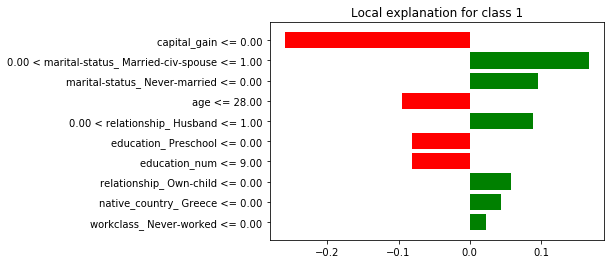

In [39]:
# Use semicolon at the end otherwise below command renders same plot twice
exp_TN.as_pyplot_figure();
print(f'True value:{y_train[1]}, Predicted value:{y_train_pred[1]}')

**Observations:**
- Model rightly predicts it to be '0'
- Here we get lot of clarity how each variable affects a particular data point i.e. at local level
- Variables in red push the values towards '0' and variables in green push the values towards '1'
- 'capital_gain' <=0, 'age'<=28, 'education_num'<=9 'native_country' in ['Trinadad & Tobago', 'Hungary', 'Yugoslavia'] push the prediction towards '0'
- 'marital-status_ Married-civ-spouse'==1, 'marital-status_ Never-married'==0, 'relationship_ Husband'==1 and 'workclass_ Never-worked'<=0 push the prediction towards '1'
- It is quite intuitive that because this person has no capital_gain, because he is young, comparatively education is low these aspects push the prediction to income being '<=50K', on the flip side, because he is a male and he is working these aspects tend to push prediction towards income being '>50K'
- It seems 'capital_gain'==0, 'marital-status_ Married-civ-spouse'==1 and 'relationship_ Husband'==1 are palying important part in the prediction
- Since, being male is considered to be having income '>50K', this model seems a bit bias towards gender=='male'

In [61]:
exp_TN.show_in_notebook()

**Observations:**<br>
- The above plot is very intuitive
- Model rightly predicts it to be '0'
- The model has predicted this person to be eearning '<=50K' with 0.55 probability
- capital_gain, age, and not being from countries ['Trinadad & Tobago', 'Hungary', 'Yugoslavia'] have increased the probability to 0.55
- marital-status, relationship, working-class have pushed the probabilty towards 0.45
- It seems 'capital_gain'==0, 'marital-status_ Married-civ-spouse'==1 and 'relationship_ Husband'==1 are palying important part in the prediction

In [42]:
# Executing the explainer for plotting
exp_TP = explainer.explain_instance(df_train.iloc[5].values, rf.predict_proba, num_features=10)

True value:1, Predicted value:1


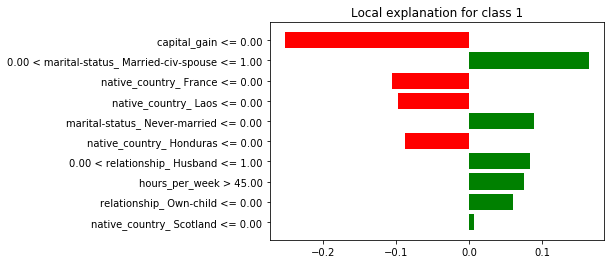

In [59]:
# Use semicolon at the end otherwise below command renders same plot twice
exp_TP.as_pyplot_figure();
print(f'True value:{y_train.values[5]}, Predicted value:{y_train_pred[5]}')

**Observations:**
- Model rightly predicts it to be '1'
- Here we get lot of clarity how each variable affects a particular data point i.e. at local level
- Variables in red push the values towards '0' and variables in green push the values towards '1'
- 'capital_gain' <=0 and 'native_country' in ['France', 'Laos', 'Honduras'] push the prediction towards '0'
- 'marital-status_ Married-civ-spouse'==1, 'marital-status_ Never-married'==0, 'relationship_ Husband'==1, 'relationship_ Own-child'==0,  'hours_per_week'>45 and 'native_country' in ['Scotland'] push the prediction towards '1'
- It is quite intuitive that because this person has no capital_gain, because he is not from France these aspects push the prediction to income being '<=50K', on the flip side, because he is a male and he is married, his hours per week is greater than 45 and he is from scotland these aspects tend to push prediction towards income being '>50K'
- It seems 'capital_gain'==0, 'marital-status_ Married-civ-spouse'==1 and 'relationship_ Husband'==1 are palying important part in the prediction
- Since, being male is considered to be having income '>50K', this model seems a bit bias towards gender=='male'

In [60]:
exp_TP.show_in_notebook()

**Observations:**<br>
- The above plot is very intuitive
- Model rightly predicts it to be '1'
- The model has predicted this person to be earning '>50K' with 0.73 probability
- married, relationship as Husband, hours per week is greater than 45 and being from countries ['Scotland'] have pushed the probabilty towards 0.73
- capital_gain==0 and not being from countries ['France', 'Laos', 'Honduras'] have lowered the probability to 0.27
- It seems 'capital_gain'==0, 'marital-status_ Married-civ-spouse'==1 and 'relationship_ Husband'==1 are palying important part in the prediction

In [71]:
# Executing the explainer for plotting
exp_FP = explainer.explain_instance(df_train.iloc[0].values, rf.predict_proba, num_features=10)

True value:0, Predicted value:1


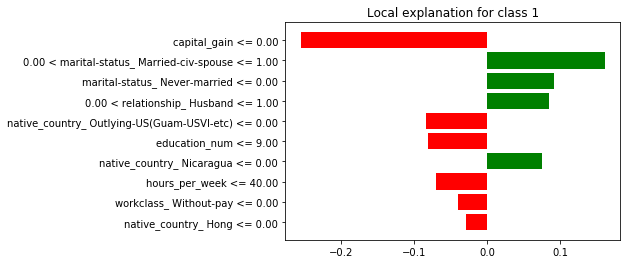

In [72]:
# Use semicolon at the end otherwise below command renders same plot twice
exp_FP.as_pyplot_figure();
print(f'True value:{y_train.values[0]}, Predicted value:{y_train_pred[0]}')

**Observations:**
- Model wrongly predicts it to be '1'
- Here we get lot of clarity how each variable affects a particular data point i.e. at local level
- Variables in red push the values towards '0' and variables in green push the values towards '1'
- It seems 'capital_gain'==0, 'marital-status_ Married-civ-spouse'==1 and 'relationship_ Husband'==1 are playing important part in the prediction
- From the above graph we may infer that **2 main features for pushing model to predict it '1' are married status civ-spouse==1 and being male**
- Since, being male is considered for having income '>50K', this model seems a bit bias towards gender=='male' and this is shown clearly in this instance

In [91]:
exp_FP.show_in_notebook()

**Observations:**<br>
- The above plot is very intuitive
- Model wrongly predicts it to be '1' and the difference between the probabilities is also less
- The model has predicted this person to be earning '>50K' with 0.59 probability
- married, relationship as Husband, and being from countries ['Nicaragua'] have pushed the probabilty towards 0.59
- capital_gain, education_num of <=9, and not being from countries ['Outlying-US', 'HongKong'] have resulted in probability of 0.41
- It seems 'capital_gain'==0, 'marital-status_ Married-civ-spouse'==1 and 'relationship_ Husband'==1 are palying important part in the prediction

In [83]:
# Executing the explainer for plotting
exp_FN = explainer.explain_instance(df_train.iloc[19].values, rf.predict_proba, num_features=10)

True value:1, Predicted value:0


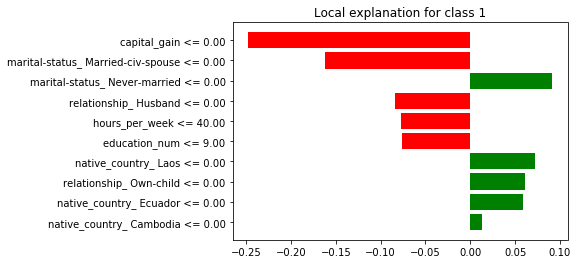

In [84]:
# Use semicolon at the end otherwise below command renders same plot twice
exp_FN.as_pyplot_figure();
print(f'True value:{y_train.values[19]}, Predicted value:{y_train_pred[19]}')

**Observations:**
- Model wrongly predicts it to be '0'
- Here we get lot of clarity how each variable affects a particular data point i.e. at local level
- Variables in red push the values towards '0' and variables in green push the values towards '1'
- It seems 'capital_gain'==0, 'marital-status_ Married-civ-spouse'==0 and 'relationship_ Husband'==0 are playing important part in the prediction
- From the above graph we may infer that **3 main features for pushing model to predict it '0' are capital_gain==0, married status civ-spouse==0 and being Female**
- Since, being female is considered for having income '<=50K', this model seems a bit bias towards gender=='male' and this is shown clearly in this instance

In [85]:
exp_FN.show_in_notebook()

**Observations:**<br>
- The above plot is very intuitive
- Model wrongly predicts it to be '0'
- The model has wrongly predicted this person to be earning '<=50K' with 0.85 probability, here the model predicts wrongly with confidence
- capital_gain, marital-status,hours per week and relationship have increased the probability to 0.85
- marital-status never-married==0, relationship-own child have pushed the probabilty towards 0.15
- It seems 'capital_gain'==0, 'marital-status_ Married-civ-spouse'==0 and 'relationship_ Husband'==0 are palying important part in the prediction

**Overall Observations:**
- 'capital_gain'==0 pushes the model prediction towards '0'
- 'marital-status_ Married-civ-spouse'==1 and 'relationship_ Husband'==1 pushed model prediction towards '1'
- When all the three features that is 'capital_gain'==0, 'marital-status_ Married-civ-spouse'==1 and 'relationship_ Husband'==1 are present then the model prediction gets pushed towards '1', which means 'marital-status_ Married-civ-spouse'==1 and 'relationship_ Husband'==1 has larger say in the model prediction
- 'capital_gain', 'marital-status_ Married-civ-spouse' and 'relationship_ Husband' are among top 5 features deemed important by random forest model
- Other 2 features considered to be important by random forest model are 'education_num' and 'marital-status_ Never-married'==0, it is obvious that when a person is married or relationship is husband then 'marital-status_ Never-married' wiil be zero
- Since, gender being female is considered a reason for having income '<=50K', this model seems a bit bias towards gender=='male' and this is shown clearly in this instance

# 2. XGBoost Classifier

In [20]:
xgb = XGBClassifier(n_estimators=500, max_depth=10, random_state=42, learning_rate=0.05,
                    gamma=0.1, eval_metric='logloss', use_label_encoder=False,
                    min_child_weight=0.1, reg_lambda=1, reg_alpha=20,
                    max_delta_step=10, scale_pos_weight=3.1291849847818733)

In [24]:
# df_train = df_train.astype('int')

In [21]:
xgb.fit(df_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              eval_metric='logloss', gamma=0.1, gpu_id=-1, importance_type=None,
              interaction_constraints='', learning_rate=0.05, max_delta_step=10,
              max_depth=10, min_child_weight=0.1, missing=nan,
              monotone_constraints='()', n_estimators=500, n_jobs=8,
              num_parallel_tree=1, predictor='auto', random_state=42,
              reg_alpha=20, reg_lambda=1, scale_pos_weight=3.1291849847818733,
              subsample=1, tree_method='exact', use_label_encoder=False,
              validate_parameters=1, verbosity=None)

In [26]:
xgb_imp = pd.DataFrame(xgb.feature_importances_, df_train.columns).sort_values(by=0, ascending=False).nlargest(10,columns=0)

In [79]:
comb_imp = pd.concat([rf_imp.reset_index().rename(columns={'index':'RF_Features',0:'Importance'}),
           xgb_imp.reset_index().rename(columns={'index':'XGB_Features',0:'Importance'})], axis=1)
comb_imp

,RF_Features,Importance,XGB_Features,Importance
0,marital-status_ Married-civ-spouse,0.184040,marital-status_ Married-civ-spouse,0.666349
1,relationship_ Husband,0.104307,education_num,0.036804
2,education_num,0.092039,capital_gain,0.032012
3,marital-status_ Never-married,0.089166,relationship_ Own-child,0.015595
4,capital_gain,0.083345,capital_loss,0.010033
5,age,0.080959,age,0.008376
6,hours_per_week,0.041586,occupation_ Exec-managerial,0.007549
7,relationship_ Own-child,0.038131,hours_per_week,0.007281
8,relationship_ Not-in-family,0.026547,sex_ Female,0.007020
9,relationship_ Wife,0.023414,occupation_ Other-service,0.006288


In [25]:
y_xgb_pred = xgb.predict(df_train.values)
y_xgb_pred[:5]

array([1, 0, 0, 1, 0])

In [22]:
# Initiating the lime explainer
explainer = LimeTabularExplainer(training_data=df_train.values,
                                 mode='classification',
                                 training_labels=census['inc_>50K'],
                                 feature_names=df_train.columns,
                                 random_state=42)

In [23]:
# Executing the explainer for plotting
exp_TN = explainer.explain_instance(df_train.iloc[1].values, xgb.predict_proba, num_features=10)

True value:0, Predicted value:0


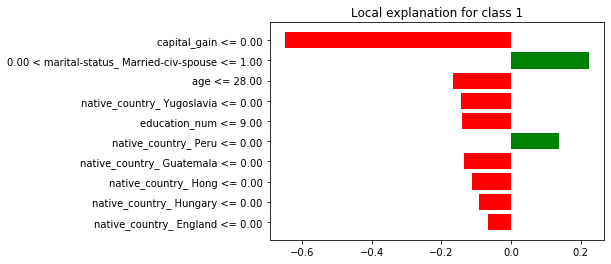

In [26]:
# Use semicolon at the end otherwise below command renders same plot twice
exp_TN.as_pyplot_figure();
print(f'True value:{y_train.values[1]}, Predicted value:{y_xgb_pred[1]}')

**Observations:**
- Model rightly predicts it to be '0'
- Here we get lot of clarity how each variable affects a particular data point i.e. at local level
- Variables in red push the values towards '0' and variables in green push the values towards '1'
- 'capital_gain' <=0, 'age'<=28, 'education_num'<=9 'native_country' not in ['Guatemala', 'Hungary', 'Yugoslavia', 'HongKong', 'England'] push the prediction towards '0'
- 'marital-status_ Married-civ-spouse'==1 and 'native_country' not in ['Peru'] push the prediction towards '1'
- It is quite intuitive that because this person has no capital_gain, because he is young, comparatively education is low these aspects push the prediction to income being '<=50K', on the flip side, because the is a person is married and the native country not being 'Peru' tends to push prediction towards income being '>50K'
- It seems 'capital_gain'==0, 'marital-status_ Married-civ-spouse'==1 and 'education_num' are playing important part in the model prediction

In [27]:
exp_TN.show_in_notebook()

**Observations:**<br>
- The above plot is very intuitive
- Model rightly predicts it to be '0'
- The model has predicted this person to be earning '<=50K' with 0.74 probability
- capital_gain, age, and not being from countries ['Guatemala', 'Hungary', 'Yugoslavia', 'HongKong', 'England'] have increased the probability to 0.74
- marital-status and 'native_country' not in ['Peru'] have pushed the prediction slightly towards '1' with probabilty of 0.26
- It seems 'capital_gain'==0, 'marital-status_ Married-civ-spouse'==1 and 'education_num' are playing important part in the model prediction

In [28]:
# Executing the explainer for plotting
exp_TP = explainer.explain_instance(df_train.iloc[5].values, xgb.predict_proba, num_features=10)

True value:1, Predicted value:1


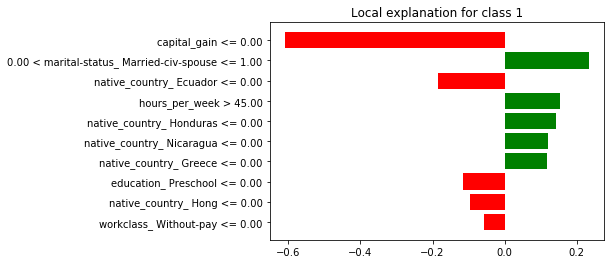

In [29]:
# Use semicolon at the end otherwise below command renders same plot twice
exp_TP.as_pyplot_figure();
print(f'True value:{y_train.values[5]}, Predicted value:{y_xgb_pred[5]}')

**Observations:**
- Model rightly predicts it to be '1'
- Here we get lot of clarity how each variable affects a particular data point i.e. at local level
- Variables in red push the values towards '0' and variables in green push the values towards '1'
- 'marital-status_ Married-civ-spouse'==1, 'hours_per_week' and 'native_country' not in ['Honduras', 'Nicaragua', 'Greece'] push the prediction towards '1', this is expected because these are economies with low income
- 'capital_gain' <=0, 'workclass_ Without-pay'==0,'education_ Preschool'==0 and 'native_country' not in ['HongKong', 'Ecuador'] push the prediction towards '0'
- It is quite intuitive that because this person has no capital_gain, comparatively education is low and also this person is not from HongKong pushes the prediction to income being '<=50K', on the flip side, because the is a person is married and 'hours_per_week'>45 it tends to push prediction towards income being '>50K'
- It seems 'capital_gain'==0, 'marital-status_ Married-civ-spouse'==1 and 'hours_per_week' are playing important part in the model prediction

In [30]:
exp_TP.show_in_notebook()

**Observations:**<br>
- The above plot is very intuitive
- Model rightly predicts it to be '1'
- The model has predicted this person to be earning '<=50K' with 0.88 probability, model is very confident
- capital_gain, hours_per_week, and not being from countries ['Honduras', 'Nicaragua', 'Greece'] have increased the probability to 0.88
- capital_gain==0 and 'native_country' not in ['HongKong'] and 'education_ Preschool' have pushed the prediction slightly towards '1' with probabilty of 0.12
- It seems 'capital_gain'==0, 'marital-status_ Married-civ-spouse'==1 and 'hours_per_week' are playing important part in the model prediction

In [31]:
# Executing the explainer for plotting
exp_FP = explainer.explain_instance(df_train.iloc[0].values, xgb.predict_proba, num_features=10)

True value:0, Predicted value:1


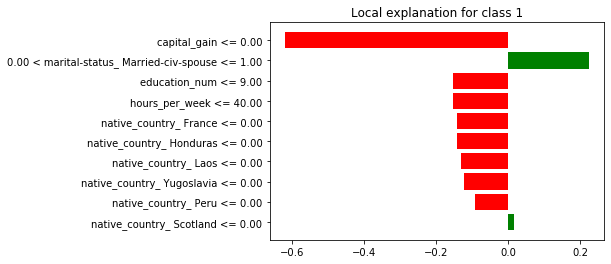

In [32]:
# Use semicolon at the end otherwise below command renders same plot twice
exp_FP.as_pyplot_figure();
print(f'True value:{y_train.values[0]}, Predicted value:{y_xgb_pred[0]}')

**Observations:**
- Model wrongly predicts it to be '1'
- Here we get lot of clarity how each variable affects a particular data point i.e. at local level
- Variables in red push the values towards '0' and variables in green push the values towards '1'
- 'marital-status_ Married-civ-spouse'==1 and 'native_country' not in ['Scotland'] push the prediction towards '1'
- 'capital_gain'<=0, 'hours_per_week'<=40,'education_num'<=9 and 'native_country' not in ['France', 'Honduras', 'Laos', 'Yugoslavia', 'Peru'] push the prediction towards '0', 'capital_gain'<=0 has huge impact
- It is quite intuitive that because this person has no capital_gain, comparatively education being low pushes the prediction to income being '<=50K', on the flip side, because the is a person is married it tends to push prediction towards income being '>50K', it seems model is considering 'marital-status_ Married-civ-spouse' to be of utmost importance, and on that basis it is predicting the income to be '>50K'
- It seems 'capital_gain'==0, 'marital-status_ Married-civ-spouse'==1 and 'hours_per_week' are playing important part in the model prediction

In [33]:
exp_FP.show_in_notebook()

**Observations:**
- The above plot is very intuitive
- Model wrongly predicts it to be '1'
- The model has predicted this person to be earning '>50K' with 0.62 probability
- 'marital-status_ Married-civ-spouse'==1 and 'native_country' not in ['Scotland'] have wrongly pushed the prediction towards '1' with probabilty of 0.62
- capital_gain, hours_per_week, and not being from countries ['France', 'Honduras', 'Laos', 'Yugoslavia', 'Peru'] have reduced the probability to 0.38
- It seems 'capital_gain'==0, 'marital-status_ Married-civ-spouse'==1, 'education_num' and 'hours_per_week' are playing important part in the model prediction

In [34]:
# Executing the explainer for plotting
exp_FN = explainer.explain_instance(df_train.iloc[19].values, xgb.predict_proba, num_features=10)

True value:1, Predicted value:0


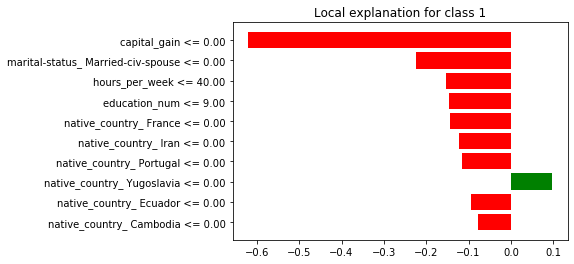

In [35]:
# Use semicolon at the end otherwise below command renders same plot twice
exp_FN.as_pyplot_figure();
print(f'True value:{y_train.values[19]}, Predicted value:{y_xgb_pred[19]}')

**Observations:**
- Model wrongly predicts it to be '0'
- Here we get lot of clarity how each variable affects a particular data point i.e. at local level
- Variables in red push the values towards '0' and variables in green push the values towards '1'
- 'marital-status_ Married-civ-spouse'==0, hours_per_week <=40 and 'capital_gain'==0 push the prediction towards '0', for this data point 'capital_gain'<=0 has huge impact on model predicting it to be '0'
- 'Only 'native_country' not in ['Yugoslavia'] push the prediction towards '1'
- It is quite intuitive that because this person has no capital_gain, comparatively education being low pushes the prediction to towards income being '<=50K'
- It seems 'capital_gain'==0, 'education_num' and 'hours_per_week' are playing important part in the model prediction

In [36]:
exp_FN.show_in_notebook()

**Observations:**
- The above plot is very intuitive
- Model wrongly predicts it to be '0'
- The model has predicted this person to be earning '<=50K' with 0.89 probability, here model makes wrong prediction with lot of confidence majorly based on the fact that 'capital_gain'==0, 'marital-status_ Married-civ-spouse'==0
- 'capital_gain'==0, 'marital-status_ Married-civ-spouse'==0, 'education_num'==9 and 'hours_per_week'==40 have wrongly pushed the prediction towards '0' with probabilty of 0.89
- Not being from countries ['Yugoslavia'] is the only features in this case which has taken the probability to 0.11
- It seems 'capital_gain'==0, 'marital-status_ Married-civ-spouse'==1, 'education_num' and 'hours_per_week' are playing important part in the model prediction

**Overall Observations:**
- 'capital_gain'==0 'education_num'==9 and 'hours_per_week'==40 pushed the model prediction towards '0'
- 'marital-status_ Married-civ-spouse'==1 pushed model prediction towards '1'
- When all the three features that is 'capital_gain'==0, 'marital-status_ Married-civ-spouse'==1 and 'hours_per_week'==9 are present then the model prediction gets pushed towards '1', which means 'marital-status_ Married-civ-spouse'==1 has larger say in the model prediction
- 'capital_gain', 'marital-status_ Married-civ-spouse' and 'education_num' are among top 5 features deemed important by XG Boost model
- Other 2 features considered to be important by XG Boost model are 'relationship_ Own-child' and 'capital+loss', however they don't feature in the prediction of data points we mentioned above
- Unlike random forest model which is biased towards gender being 'male', XG Boost model does not show that bias when analysing the above mentioned data points, so is this model unbiased?, this we can't say
***Note:** *For Random Forest model and XG Boost model, features such as 'marital-status_ Married-civ-spouse'==1 and 'capital_gain'==0 are of major importance*